 # DL Assignment 2

-------------------------------------------------------------------------------

## Topic: Implementing Deep Neural Networks using multiple Optimizers, Dropout and Learning Rates

Name: Priyanka Nandkumar Gaikwad

Roll no: 23

PRN: 12210124

Database of character image features: https://archive.ics.uci.edu/dataset/59/letter+recognition

Additional Information

The objective is to identify each of a large number of black-and-white rectangular pixel displays as one of the 26 capital letters in the English alphabet.  The character images were based on 20 different fonts and each letter within these 20 fonts was randomly distorted to produce a file of 20,000 unique stimuli.  Each stimulus was converted into 16 primitive numerical attributes (statistical moments and edge counts) which were then scaled to fit into a range of integer values from 0 through 15.  We typically train on the first 16000 items and then use the resulting model to predict the letter category for the remaining 4000.  See the article cited above for more details.




### Necessary Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from tensorflow.keras.utils import to_categorical
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import SGD, Adam, RMSprop

2025-05-10 22:02:30.282000: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746914550.518308      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746914550.581110      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
!pip install ucimlrepo

### Load Dataset

In [3]:
from ucimlrepo import fetch_ucirepo
letter_recognition = fetch_ucirepo(id=59)
X = letter_recognition.data.features
y = letter_recognition.data.targets

### EDA

Dataset shape: (20000, 16)

First few rows of features:
   x-box  y-box  width  high  onpix  x-bar  y-bar  x2bar  y2bar  xybar  x2ybr  \
0      2      8      3     5      1      8     13      0      6      6     10   
1      5     12      3     7      2     10      5      5      4     13      3   
2      4     11      6     8      6     10      6      2      6     10      3   
3      7     11      6     6      3      5      9      4      6      4      4   
4      2      1      3     1      1      8      6      6      6      6      5   

   xy2br  x-ege  xegvy  y-ege  yegvx  
0      8      0      8      0      8  
1      9      2      8      4     10  
2      7      3      7      3      9  
3     10      6     10      2      8  
4      9      1      7      5     10  

Target variable name: lettr

Target distribution:
lettr
U    813
D    805
P    803
T    796
M    792
A    789
X    787
Y    786
N    783
Q    783
F    775
G    773
E    768
B    766
V    764
L    761
R    758
I    755
O   

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

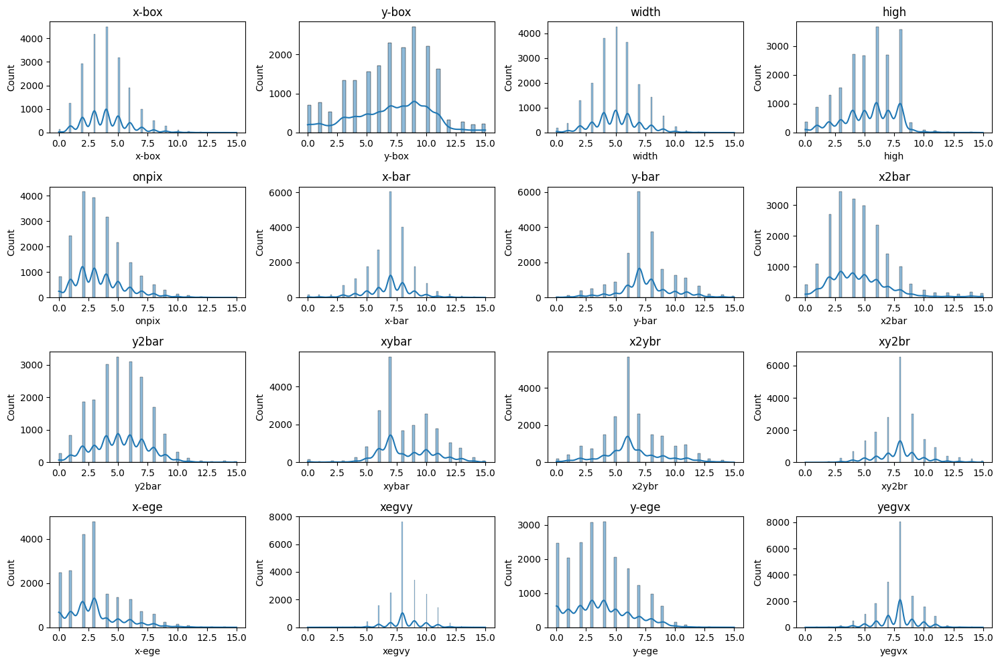

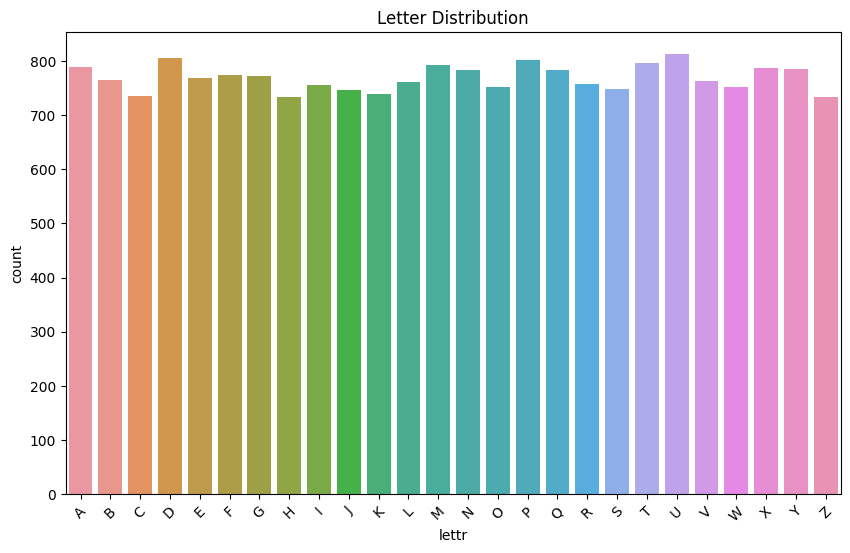

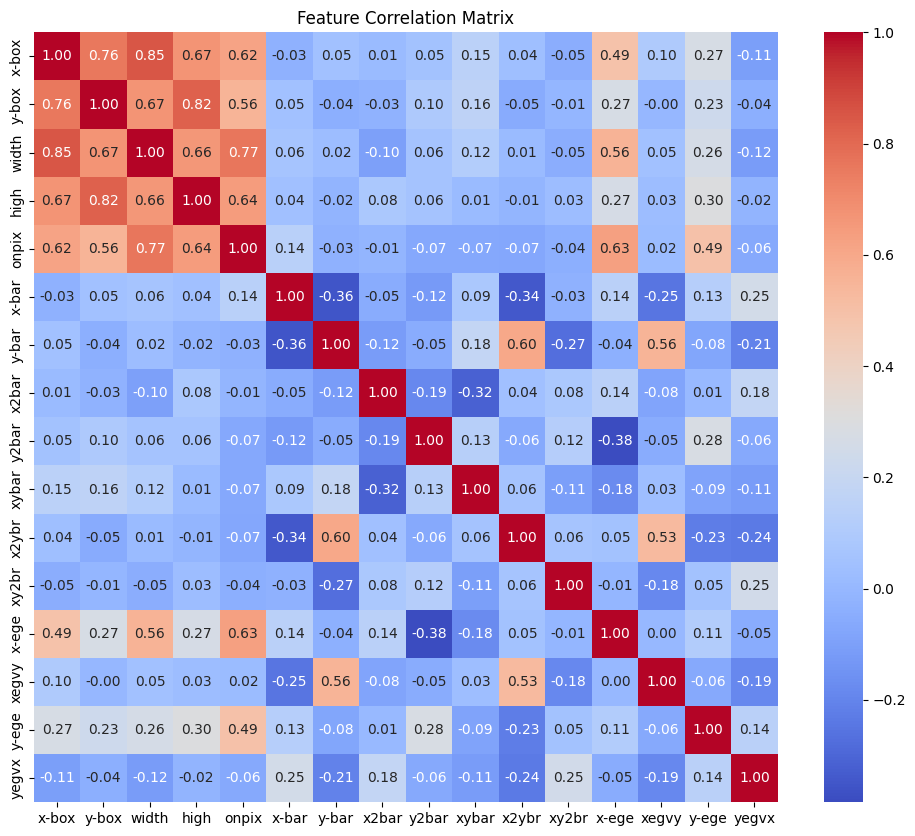

In [4]:
# Basic EDA
print("Dataset shape:", X.shape)
print("\nFirst few rows of features:")
print(X.head())
print("\nTarget variable name:", y.columns[0])  # Print the actual column name
print("\nTarget distribution:")
print(y.iloc[:, 0].value_counts())  # Access first column regardless of its name

# Check for missing values
print("\nMissing values in features:")
print(X.isnull().sum())

# Visualize feature distributions
plt.figure(figsize=(15, 10))
for i, col in enumerate(X.columns):
    plt.subplot(4, 4, i+1)
    sns.histplot(X[col], kde=True)
    plt.title(col)
plt.tight_layout()
plt.show()

# Visualize target distribution
plt.figure(figsize=(10, 6))
sns.countplot(data=y, x=y.columns[0], order=sorted(y.iloc[:, 0].unique()))
plt.title('Letter Distribution')
plt.xticks(rotation=45)
plt.show()

# Correlation matrix
plt.figure(figsize=(12, 10))
corr_matrix = X.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Feature Correlation Matrix')
plt.show()

## Preprocessing dataset

In [6]:
# Preprocessing
# Encode labels (using the first column of y)
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y.iloc[:, 0])

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)

# Convert labels to one-hot encoding
y_train_cat = to_categorical(y_train)
y_test_cat = to_categorical(y_test)

print("\nPreprocessed data shapes:")
print("X_train:", X_train.shape)
print("X_test:", X_test.shape)
print("y_train_cat:", y_train_cat.shape)
print("y_test_cat:", y_test_cat.shape)


Preprocessed data shapes:
X_train: (16000, 16)
X_test: (4000, 16)
y_train_cat: (16000, 26)
y_test_cat: (4000, 26)


## Model Definition, Compilation, Training

#### Optimizers:Adam, SGD, RMSprop
#### Learning Rates:0.001, 0.01, 0.0001

In [7]:
# Function to define model with dropout
def build_modelA(dropout_rate=0.0):
    model = models.Sequential([
        layers.Flatten(input_shape=(16,)),  # 16 features in the dataset
        layers.Dense(128, activation='relu'),
        layers.Dropout(dropout_rate),  # Add dropout after first hidden layer
        layers.Dense(64, activation='relu'),
        layers.Dropout(dropout_rate),  # Add dropout after second hidden layer
        layers.Dense(26, activation='softmax')  # 26 letters in the alphabet
    ])
    return model

optimizers = [Adam, SGD, RMSprop]
learning_rates = [0.001, 0.01, 0.0001]
dropout_rates = [0.2, 0.3, 0.4, 0.5] 

history_dictA = {}
trained_models = {}

# Compiling and Fit Model on dataset
for optimizer in optimizers:
    for lr in learning_rates:
        for dropout_rate in dropout_rates:
            print(f"\nTraining with {optimizer.__name__}, learning rate {lr}, dropout {dropout_rate}")
            model = build_modelA(dropout_rate)
            model.compile(optimizer=optimizer(learning_rate=lr),
                          loss='categorical_crossentropy',
                          metrics=['accuracy'])

            history = model.fit(X_train, y_train_cat,
                              epochs=10,
                              batch_size=32,
                              validation_data=(X_test, y_test_cat),
                              verbose=1)

            # Store with all hyperparameters in the key
            key = (optimizer.__name__, lr, dropout_rate)
            history_dictA[key] = history
            trained_models[key] = model

            # Evaluate model performance
            test_loss, test_acc = model.evaluate(X_test, y_test_cat, verbose=2)
            print(f"\nTest accuracy for {optimizer.__name__}, lr {lr}, dropout {dropout_rate}: {test_acc:.4f}")


Training with Adam, learning rate 0.001, dropout 0.2


/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
I0000 00:00:1746914616.872381      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1746914616.873032      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Epoch 1/10


I0000 00:00:1746914619.971629     107 service.cc:148] XLA service 0x7cdfc000fe70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746914619.972225     107 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1746914619.972240     107 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1746914620.204982     107 cuda_dnn.cc:529] Loaded cuDNN version 90300


120/500 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1291 - loss: 3.0476  

I0000 00:00:1746914621.804762     107 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


500/500 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.3262 - loss: 2.3718 - val_accuracy: 0.7527 - val_loss: 0.9166
Epoch 2/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6762 - loss: 1.0463 - val_accuracy: 0.8025 - val_loss: 0.6942
Epoch 3/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7224 - loss: 0.8640 - val_accuracy: 0.8275 - val_loss: 0.5796
Epoch 4/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7625 - loss: 0.7474 - val_accuracy: 0.8547 - val_loss: 0.4987
Epoch 5/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7925 - loss: 0.6630 - val_accuracy: 0.8702 - val_loss: 0.4419
Epoch 6/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8107 - loss: 0.6006 - val_accuracy: 0.8788 - val_loss: 0.4035
Epoch 7/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8227 - loss: 0.5625 - val_accuracy: 0.8923 - val_loss: 0.3634
Epoch 8/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8349 - loss: 0.5191 - val_accuracy: 0.9000 - val_

## Classification Evaluation for Each model


### Classification Reports and Confusion Matrices


                             CLASSIFICATION REPORTS                             



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classif

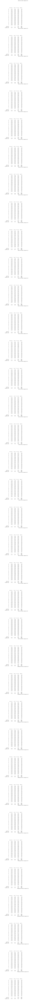


                               CONFUSION MATRICES                               



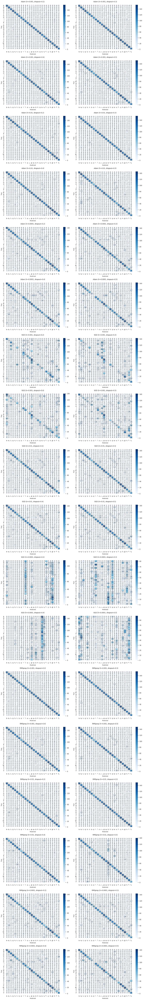

In [8]:
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def print_report_matrix(models_dict, test_features, test_labels, class_names=None):
    # Set visual style
    plt.style.use('seaborn-v0_8') if 'seaborn-v0_8' in plt.style.available else plt.style.use('ggplot')
    sns.set_theme(style="whitegrid")
    sns.set_palette("pastel")

    # ====================
    # Classification Reports
    # ====================
    print("\n" + "="*80)
    print("CLASSIFICATION REPORTS".center(80))
    print("="*80 + "\n")

    plt.figure(figsize=(12, 7*len(models_dict)))

    for i, (model_params, model) in enumerate(models_dict.items(), 1):
        optimizer_name, lr, dropout_rate = model_params
        model_name = f"{optimizer_name} (lr={lr}, dropout={dropout_rate})"
        
        y_pred = model.predict(test_features, verbose=0)
        y_pred_classes = np.argmax(y_pred, axis=1)
        true_classes = np.argmax(test_labels, axis=1)

        report = classification_report(true_classes, y_pred_classes,
                                    target_names=class_names)

        ax = plt.subplot(len(models_dict), 1, i)
        ax.text(0.1, 0.1, report, fontfamily='monospace', fontsize=10, va='top')
        ax.set_title(f"{model_name}", pad=20, fontsize=12)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

    # =================
    # Confusion Matrices
    # =================
    print("\n" + "="*80)
    print("CONFUSION MATRICES".center(80))
    print("="*80 + "\n")

    n_models = len(models_dict)
    n_cols = min(2, n_models)
    n_rows = (n_models + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 6*n_rows))
    if n_models == 1:
        axes = np.array([axes])
    axes = axes.flatten()

    for i, (model_params, model) in enumerate(models_dict.items()):
        optimizer_name, lr, dropout_rate = model_params
        model_name = f"{optimizer_name} (lr={lr}, dropout={dropout_rate})"
        
        y_pred = model.predict(test_features, verbose=0)
        y_pred_classes = np.argmax(y_pred, axis=1)
        true_classes = np.argmax(test_labels, axis=1)

        cm = confusion_matrix(true_classes, y_pred_classes)

        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                   xticklabels=class_names,
                   yticklabels=class_names,
                   ax=axes[i])

        axes[i].set_title(f"{model_name}", pad=20, fontsize=12)
        axes[i].set_xlabel('Predicted', fontsize=10)
        axes[i].set_ylabel('True', fontsize=10)
        axes[i].tick_params(axis='x', rotation=45)
        axes[i].tick_params(axis='y', rotation=0)

    # Hide unused axes
    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Get class names (A-Z)
class_names = [chr(i) for i in range(ord('A'), ord('Z')+1)]

# Call the function
print_report_matrix(trained_models, X_test, y_test_cat, class_names=class_names)

### Loss and Accuracy Curves

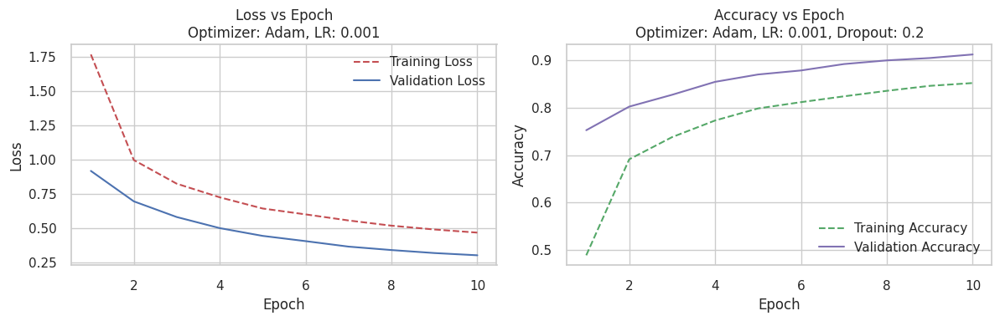

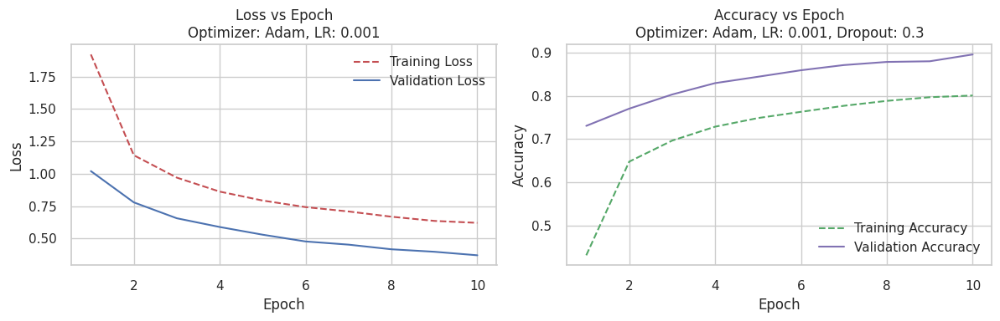

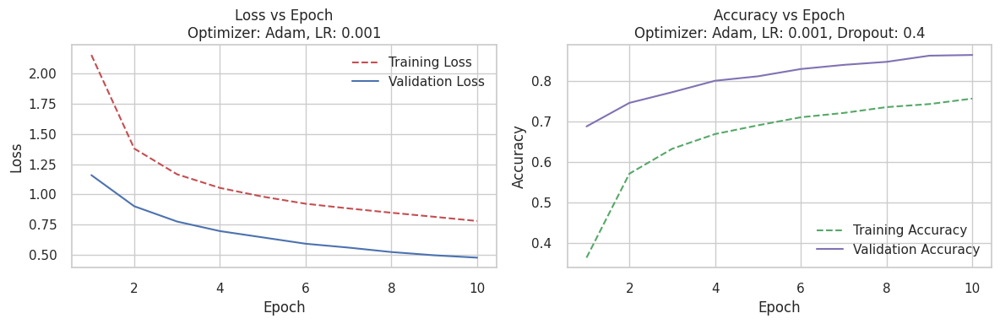

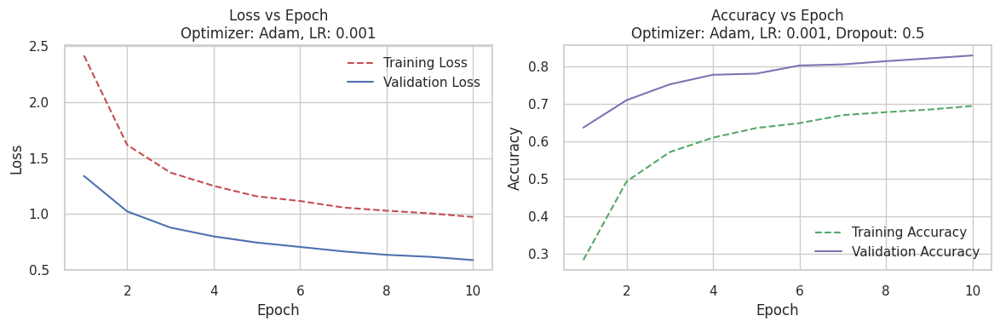

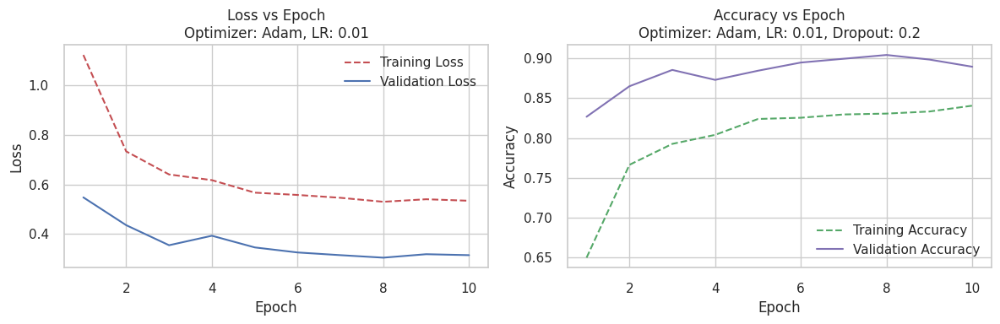

...

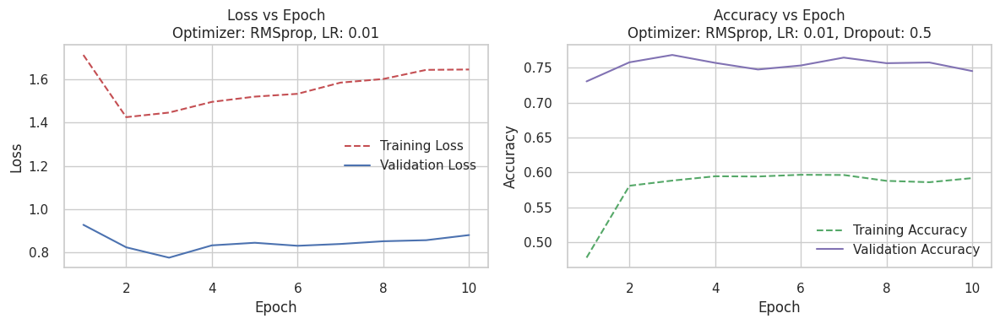

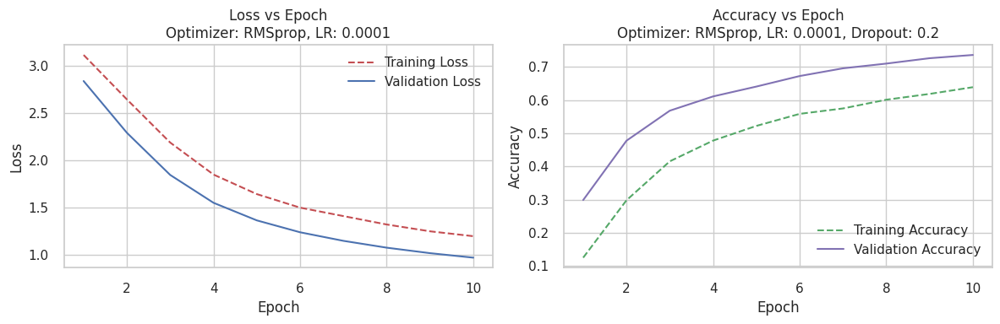

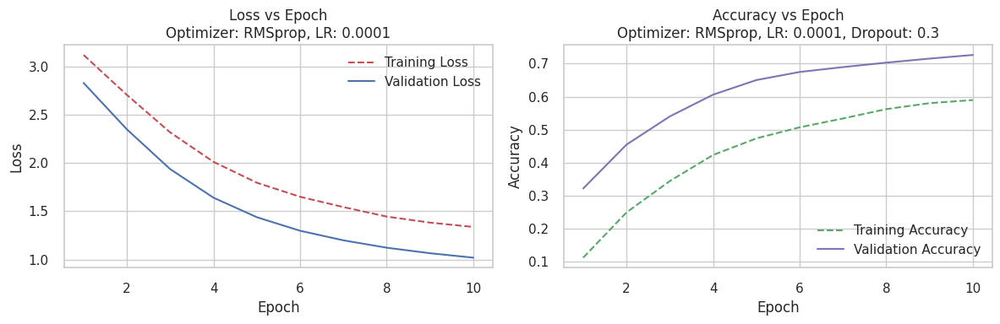

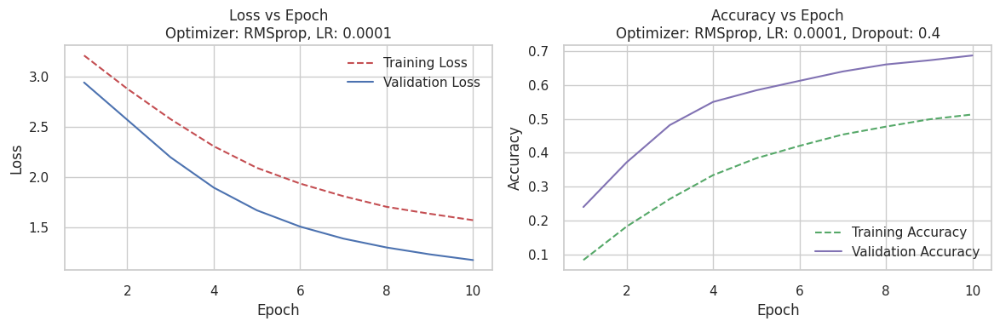

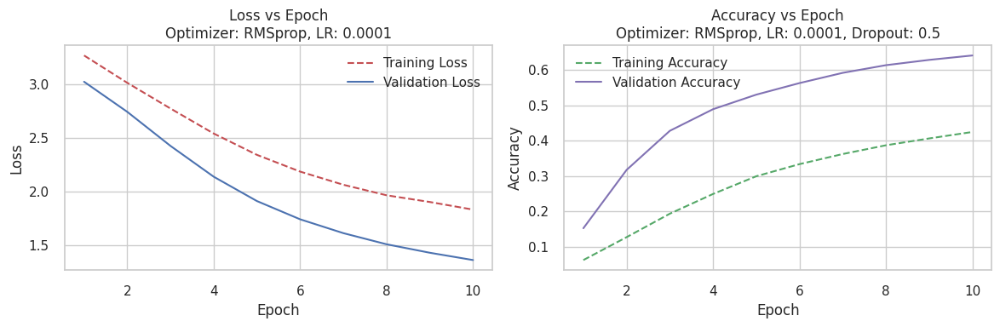

In [9]:
# Plot Loss and Accuracy Curve for each model
for key, history in history_dictA.items():
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))

        epochs = range(1, len(history.history['loss']) + 1)
        training_loss = history.history['loss']
        validation_loss = history.history['val_loss']
        training_acc = history.history['accuracy']
        validation_acc = history.history['val_accuracy']

        axes[0].plot(epochs, training_loss, 'r--', label='Training Loss')
        axes[0].plot(epochs, validation_loss, 'b-', label='Validation Loss')
        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Loss')
        axes[0].set_title(f'Loss vs Epoch\nOptimizer: {key[0]}, LR: {key[1]}')
        axes[0].legend()

        axes[1].plot(epochs, training_acc, 'g--', label='Training Accuracy')
        axes[1].plot(epochs, validation_acc, 'm-', label='Validation Accuracy')
        axes[1].set_xlabel('Epoch')
        axes[1].set_ylabel('Accuracy')
        axes[1].set_title(f'Accuracy vs Epoch\nOptimizer: {key[0]}, LR: {key[1]}, Dropout: {key[2]}')
        axes[1].legend()

        plt.tight_layout()
        plt.show()

### ROC-AUC Curves

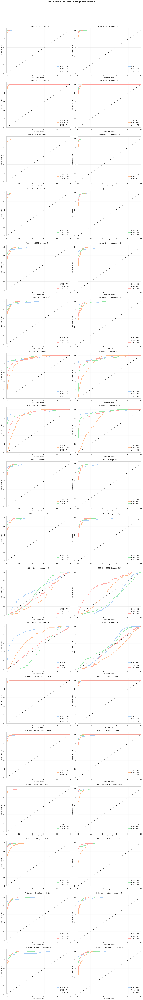

In [10]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
from math import ceil

def plot_roc_curves_letter(models_dict, X_test, y_test_cat, class_names=None):
    """
    Plot ROC curves for multiple letter recognition models in a grid layout

    Args:
        models_dict: Dictionary of trained models {(optimizer_name, lr): model}
        X_test: Test features (standardized)
        y_test_cat: One-hot encoded test labels
        class_names: List of class names (A-Z) - optional
    """
    # Calculate grid size
    n_models = len(models_dict)
    n_cols = 2  # Number of columns in the grid
    n_rows = ceil(n_models / n_cols)

    # Create figure
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(16, 6*n_rows))
    fig.suptitle('ROC Curves for Letter Recognition Models', y=1.02, fontsize=16, fontweight='bold')

    # If only one model, convert axs to array for consistent handling
    if n_models == 1:
        axs = np.array([axs])

    # Flatten axes array for easy iteration
    axs = axs.flatten()

    # Plot ROC curves for each model
    for ax, (model_key, model) in zip(axs, models_dict.items()):
        # Get predictions
        y_prob = model.predict(X_test, verbose=0)
        y_true = y_test_cat

        # Plot ROC curve for each class (we'll show just a subset for clarity)
        classes_to_plot = [0, 1, 2, 25]  # A, B, C, Z as representative classes
        for i in classes_to_plot:
            fpr, tpr, _ = roc_curve(y_true[:, i], y_prob[:, i])
            roc_auc = auc(fpr, tpr)

            # Use class names if available, otherwise use class index
            label_name = class_names[i] if class_names else f'Class {i}'
            ax.plot(fpr, tpr, lw=2,
                   label=f'{label_name} (AUC = {roc_auc:.2f})')

        # Formatting
        ax.plot([0, 1], [0, 1], 'k--', lw=1)
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('False Positive Rate', fontsize=10)
        ax.set_ylabel('True Positive Rate', fontsize=10)

        # Create title from model key (optimizer name and learning rate)
        optimizer_name, lr, dropout = model_key
        ax.set_title(f'{optimizer_name} (lr={lr}, dropout={dropout})', fontsize=12, pad=10)

        ax.grid(alpha=0.3)
        ax.legend(loc='lower right', fontsize=9)

    # Hide any unused subplots
    for i in range(n_models, len(axs)):
        axs[i].axis('off')

    plt.tight_layout()
    plt.show()

# Generate class names (A-Z)
class_names = [chr(i) for i in range(ord('A'), ord('Z')+1)]

# Call the function with our models and data
plot_roc_curves_letter(trained_models, X_test, y_test_cat, class_names=class_names)

## Comparative Analysis of all the models

### Accuracy and Loss Curves per Optimizer

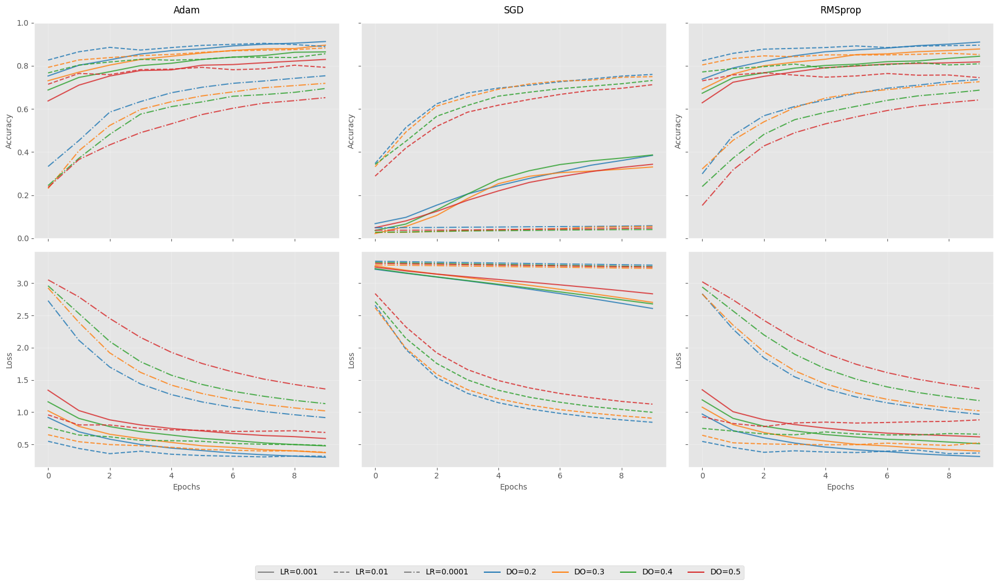

In [14]:
import matplotlib.pyplot as plt
import numpy as np

# Set up the plot with 3 columns (one per optimizer) and 2 rows (accuracy/loss)
fig, axs = plt.subplots(2, 3, figsize=(18, 10), sharex=True, sharey='row')
plt.style.use('ggplot')

# Define line styles for different hyperparameters
lr_styles = {0.001: '-', 0.01: '--', 0.0001: '-.'}
dropout_colors = {0.2: '#1f77b4', 0.3: '#ff7f0e', 0.4: '#2ca02c', 0.5: '#d62728'}

for col, opt_name in enumerate(['Adam', 'SGD', 'RMSprop']):
    # Accuracy plot (top row)
    ax_acc = axs[0, col]
    # Loss plot (bottom row)
    ax_loss = axs[1, col]
    
    # Plot each configuration for this optimizer
    for (opt, lr, dropout), history in history_dictA.items():
        if opt == opt_name:
            line_style = lr_styles[lr]
            color = dropout_colors[dropout]
            label = f"lr={lr}, do={dropout}"
            
            # Top: Accuracy curves
            ax_acc.plot(history.history['val_accuracy'], 
                       linestyle=line_style, color=color,
                       alpha=0.8, linewidth=1.5, label=label)
            
            # Bottom: Loss curves
            ax_loss.plot(history.history['val_loss'],
                       linestyle=line_style, color=color,
                       alpha=0.8, linewidth=1.5, label=label)

    # Formatting
    ax_acc.set_title(f'{opt_name}', pad=12, fontsize=12)
    ax_acc.set_ylabel('Accuracy', fontsize=10)
    ax_acc.grid(True, alpha=0.3)
    ax_acc.set_ylim(0, 1)
    
    ax_loss.set_xlabel('Epochs', fontsize=10)
    ax_loss.set_ylabel('Loss', fontsize=10)
    ax_loss.grid(True, alpha=0.3)

# Create unified legends
handles = []
for lr, style in lr_styles.items():
    handles.append(plt.Line2D([], [], color='gray', linestyle=style, 
                            label=f'LR={lr}'))
for do, color in dropout_colors.items():
    handles.append(plt.Line2D([], [], color=color, linestyle='-',
                            label=f'DO={do}'))

fig.legend(handles=handles, loc='lower center', 
          ncol=len(lr_styles)+len(dropout_colors),
          bbox_to_anchor=(0.5, -0.05),
          frameon=True, fontsize=10)

plt.tight_layout(rect=[0, 0.1, 1, 1])  # Adjust for legend
plt.show()

### ROC-AUC curves per Optimizer

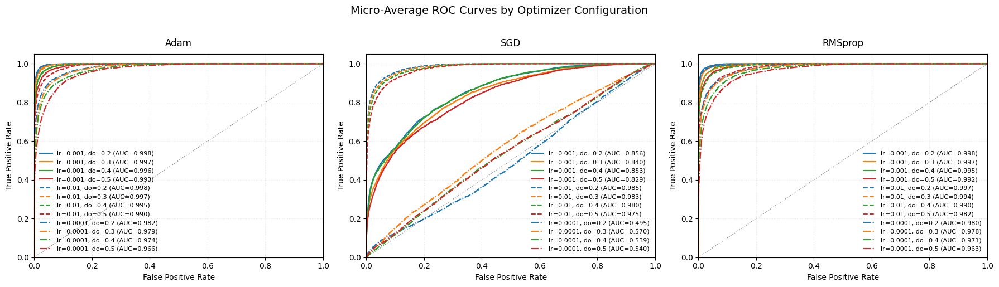

In [19]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np

# Set style with white background
plt.style.use('default')
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.grid'] = True
plt.rcParams['grid.alpha'] = 0.2

# Get class names (A-Z)
class_names = [chr(i) for i in range(ord('A'), ord('Z')+1)]

# Create figure with subplots for each optimizer
optimizers = ['Adam', 'SGD', 'RMSprop']
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# Define consistent color scheme for dropout rates
dropout_colors = {
    0.2: '#1f77b4',  # Blue
    0.3: '#ff7f0e',  # Orange
    0.4: '#2ca02c',  # Green
    0.5: '#d62728'   # Red
}

# Define line styles for learning rates
lr_styles = {
    0.001: '-',
    0.01: '--',
    0.0001: '-.'
}

for ax, optimizer in zip(axs, optimizers):
    # Plot each configuration for current optimizer
    for (opt, lr, dropout), model in trained_models.items():
        if opt == optimizer:
            y_score = model.predict(X_test, verbose=0)
            fpr, tpr, _ = roc_curve(y_test_cat.ravel(), y_score.ravel())
            roc_auc = auc(fpr, tpr)
            
            ax.plot(fpr, tpr,
                   color=dropout_colors[dropout],
                   linestyle=lr_styles[lr],
                   lw=1.5,
                   label=f'lr={lr}, do={dropout} (AUC={roc_auc:.3f})')

    # Format subplot
    ax.plot([0, 1], [0, 1], 'k:', lw=1, alpha=0.5)
    ax.set_title(optimizer, fontsize=12, pad=10)
    ax.set_xlabel('False Positive Rate', fontsize=10)
    ax.set_ylabel('True Positive Rate', fontsize=10)
    ax.legend(fontsize=8, frameon=False)
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.grid(True, linestyle=':', alpha=0.3)

plt.suptitle('Micro-Average ROC Curves by Optimizer Configuration', y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

### Validation Accuracy Comparison per Optimizer

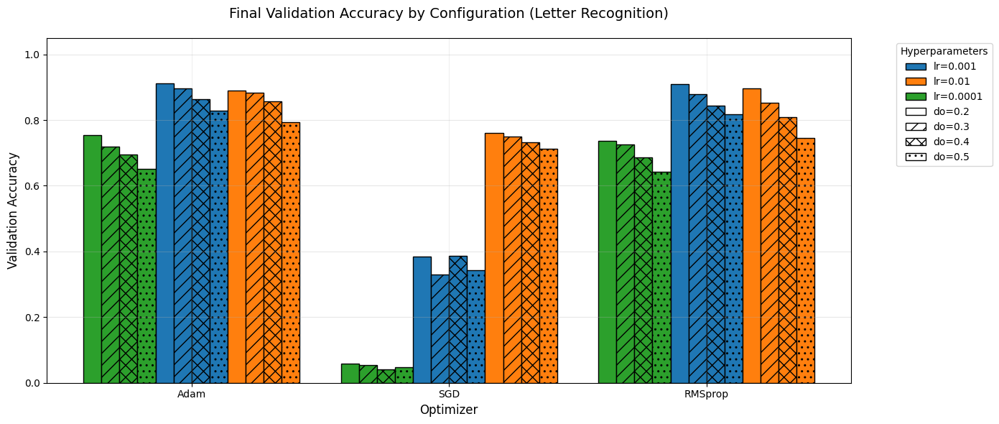

In [23]:
import numpy as np
import matplotlib.pyplot as plt

# Prepare data - now including dropout rates
bar_data = {}
for (opt, lr, dropout), history in history_dictA.items():
    if opt not in bar_data:
        bar_data[opt] = {}
    bar_data[opt][f"lr={lr}, do={dropout}"] = history.history['val_accuracy'][-1]

optimizers = list(bar_data.keys())
configs = sorted({cfg for opt in bar_data.values() for cfg in opt})
val_acc_matrix = [[bar_data[opt].get(cfg, 0) for cfg in configs] for opt in optimizers]

# Set up plot
plt.figure(figsize=(14, 6))
ax = plt.gca()

# Create consistent color mapping
lr_colors = {
    0.001: '#1f77b4',  # Blue
    0.01: '#ff7f0e',   # Orange
    0.0001: '#2ca02c'  # Green
}
do_hatches = {
    0.2: '',
    0.3: '//',
    0.4: 'xx',
    0.5: '..'
}

# Plot each configuration
x = np.arange(len(optimizers))
width = 0.07  # Adjusted for more configurations

for i, cfg in enumerate(configs):
    # Extract lr and do from config string
    lr = float(cfg.split(',')[0].split('=')[1])
    do = float(cfg.split(',')[1].split('=')[1])
    
    bars = ax.bar(x + i * width, 
                 [val_acc_matrix[j][i] for j in range(len(optimizers))],
                 width=width,
                 color=lr_colors[lr],
                 edgecolor='black',
                 hatch=do_hatches[do],
                 label=cfg)

# Formatting
ax.set_ylabel('Validation Accuracy', fontsize=12)
ax.set_xlabel('Optimizer', fontsize=12)
ax.set_title('Final Validation Accuracy by Configuration (Letter Recognition)', fontsize=14, pad=20)
ax.set_xticks(x + width * (len(configs)-1)/2, optimizers)
ax.set_ylim([0, 1.05])
ax.grid(axis='y', alpha=0.3)

# Create custom legend
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor=color, edgecolor='black', label=f'lr={lr}') 
    for lr, color in lr_colors.items()
] + [
    Patch(facecolor='white', edgecolor='black', hatch=hatch, label=f'do={do}') 
    for do, hatch in do_hatches.items()
]

ax.legend(handles=legend_elements, 
          title='Hyperparameters',
          bbox_to_anchor=(1.05, 1), 
          loc='upper left',
          fontsize=10)

plt.tight_layout()
plt.show()

<Figure size 1200x800 with 0 Axes>

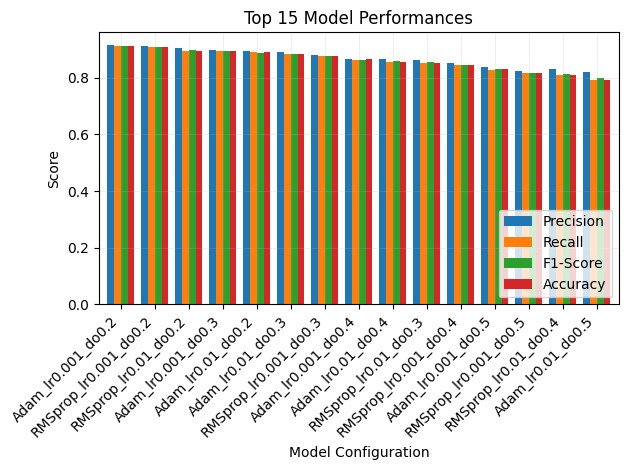

In [38]:
# Convert metrics to long format and sort
sorted_metrics = metrics_df.T.sort_values('Accuracy', ascending=False)

# Plot top N models
top_n = 15  # Adjust based on your needs
plt.figure(figsize=(12, 8))
sorted_metrics.head(top_n).plot(kind='bar', width=0.8)
plt.title(f"Top {top_n} Model Performances")
plt.ylabel("Score")
plt.xlabel("Model Configuration")
plt.xticks(rotation=45, ha='right')
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()

### Classification Metrics comparison in table format

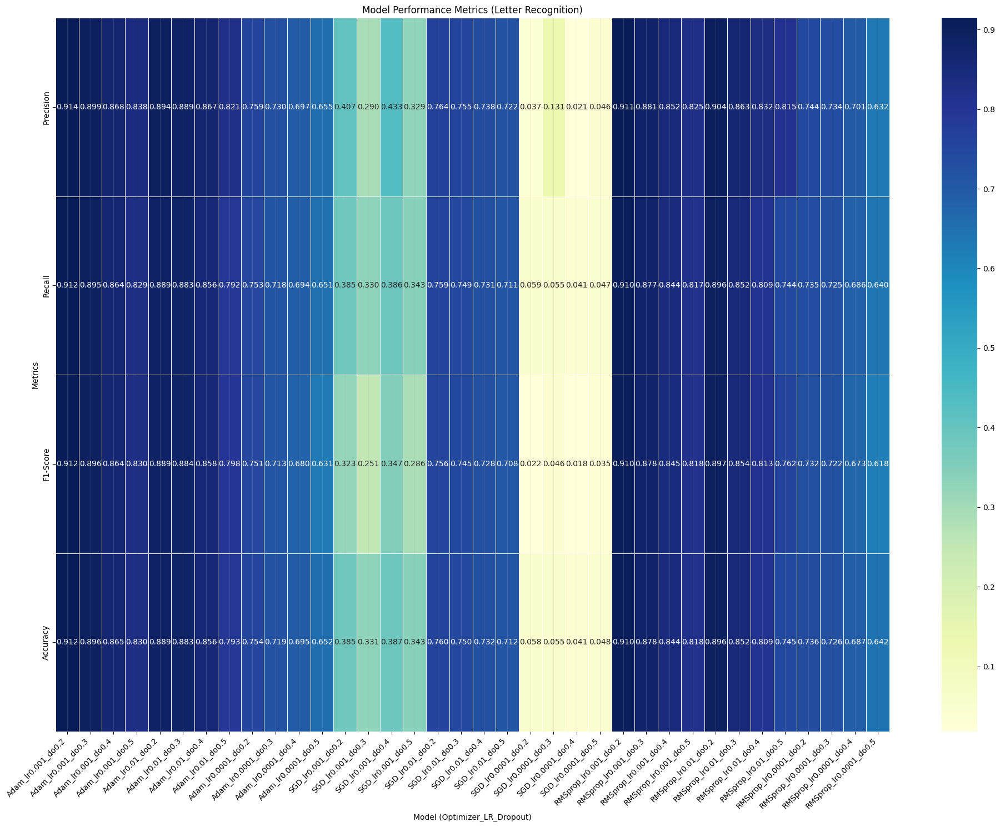


============== BEST MODEL: Adam_lr0.001_do0.2 ==============
Accuracy: 0.9125
Precision: 0.9145
Recall: 0.9121
F1-Score: 0.9125

Saved best model to: best_letter_model_Adam_lr0.001_do0.2.h5


In [32]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

# Initialize dictionary to store metrics
model_metrics = {}
best_model = None
best_accuracy = 0

# Analyze each model
for (opt, lr, dropout), model in trained_models.items():
    # Predict and convert to class indices
    y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
    y_true = np.argmax(y_test_cat, axis=1)

    # Get classification report
    report = classification_report(y_true, y_pred, 
                                 target_names=class_names, 
                                 output_dict=True,
                                 zero_division=0)

    # Calculate average metrics
    precision = np.mean([report[cls]['precision'] for cls in class_names])
    recall = np.mean([report[cls]['recall'] for cls in class_names])
    f1 = np.mean([report[cls]['f1-score'] for cls in class_names])
    accuracy = report['accuracy']

    # Store metrics with dropout included in name
    model_name = f"{opt}_lr{lr}_do{dropout}"
    model_metrics[model_name] = [precision, recall, f1, accuracy]

    # Track best model
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_model = model
        best_model_name = model_name

# Create DataFrame for heatmap
metrics_df = pd.DataFrame(model_metrics, index=['Precision', 'Recall', 'F1-Score', 'Accuracy'])

# Plot heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(metrics_df, annot=True, fmt=".3f", cmap="YlGnBu", linewidths=0.5)
plt.title("Model Performance Metrics (Letter Recognition)")
plt.ylabel("Metrics")
plt.xlabel("Model (Optimizer_LR_Dropout)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Print best model info
print("\n" + "="*60)
print(f" BEST MODEL: {best_model_name} ".center(60, "="))
print("="*60)
print(f"Accuracy: {best_accuracy:.4f}")
print(f"Precision: {metrics_df[best_model_name]['Precision']:.4f}")
print(f"Recall: {metrics_df[best_model_name]['Recall']:.4f}")
print(f"F1-Score: {metrics_df[best_model_name]['F1-Score']:.4f}")
print("="*60)

# Save best model
best_model.save(f"best_letter_model_{best_model_name}.h5")
print(f"\nSaved best model to: best_letter_model_{best_model_name}.h5")

### Testing the best performing Model

In [34]:
def visualize_and_predict_letter(model, feature_vector, class_names):
    """
    Visualize a letter from its feature vector and make a prediction

    Args:
        model: Trained model
        feature_vector: Input feature vector (16 dimensions)
        class_names: List of class names (A-Z)
    """
    # Reshape for model input
    input_data = feature_vector.reshape(1, -1)

    # Make prediction
    predictions = model.predict(input_data, verbose=0)
    predicted_class = np.argmax(predictions)
    confidence = predictions[0][predicted_class] * 100

    # Create pseudo-image visualization
    plt.figure(figsize=(10, 4))

    # Plot feature vector
    plt.subplot(1, 2, 1)
    plt.bar(range(16), feature_vector)
    plt.title('Feature Vector Visualization')
    plt.xlabel('Feature Index')
    plt.ylabel('Normalized Value')
    plt.grid(True, alpha=0.3)

    # Plot prediction probabilities
    plt.subplot(1, 2, 2)
    plt.bar(range(26), predictions[0])
    plt.title('Prediction Probabilities')
    plt.xlabel('Letter Class')
    plt.ylabel('Probability')
    plt.xticks(range(26), class_names, rotation=90)
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print("\nPREDICTION RESULTS:")
    print(f"Predicted Letter: {class_names[predicted_class]}")
    print(f"Confidence: {confidence:.2f}%")
    print("\nTop 5 Predictions:")
    top5 = np.argsort(predictions[0])[::-1][:5]
    for i, idx in enumerate(top5, 1):
        print(f"{i}. {class_names[idx]}: {predictions[0][idx]*100:.2f}%")


Testing on sample with true label: L


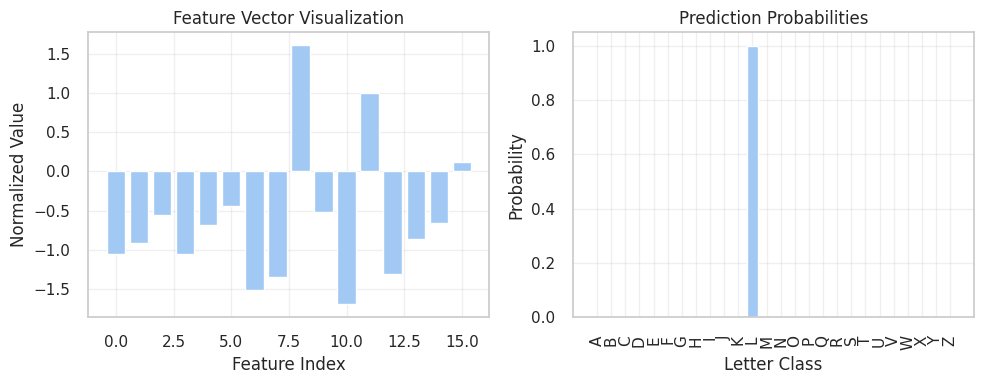


PREDICTION RESULTS:
Predicted Letter: L
Confidence: 99.96%

Top 5 Predictions:
1. L: 99.96%
2. X: 0.03%
3. K: 0.00%
4. I: 0.00%
5. C: 0.00%


In [36]:
# Get class names (A-Z)
class_names = [chr(i) for i in range(ord('A'), ord('Z')+1)]

# Select a random test sample
random_idx = np.random.randint(0, len(X_test))
sample_features = X_test[random_idx]
true_label = class_names[np.argmax(y_test_cat[random_idx])]

print(f"\nTesting on sample with true label: {true_label}")
visualize_and_predict_letter(best_model, sample_features, class_names)

## Conclusion:


For the letter recognition task, various models were evaluated using combinations of optimizers, learning rates, and dropout rates. The **best performance** was achieved using the **Adam optimizer** with a **learning rate of 0.001** and **dropout rate of 0.2**, achieving around **0.91 across all metrics**—accuracy, precision, recall, and F1-score. Models using **SGD with 0.5 dropout and 0.0001 learning rates** performed the worst. Overall, **Adam consistently outperformed RMSprop and SGD**, showing strong stability and accuracy for this classification task.
